# Исследование рынка общественного питания Москвы

## Цели и задачи

Необходимо изучить поведение пользователей в стартапе, который продаёт продукты питания. 
Задачи:
- Изучить данные в разрезе категорий, районов, рейтинга, среднего чека
- исследовать рынок кофеен.

<br> Исследование пройдет в несколько этапов:
 1. Обзор данных.
 2. Предобработка данных.
 3. Анализ данных.
 4. Предварительный вывод.
 4. Подготовка презентации.
 5. Выводы.

## Обзор данных

In [1]:
#импорт всех необходимых библиотек
try:
    import pandas as pd
    import datetime as dt
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from pandas.plotting import register_matplotlib_converters
    import warnings
    register_matplotlib_converters()
    from plotly import graph_objects as go
    import plotly.express as px
    import json
    from folium import Marker, Map, Choropleth
    from folium.plugins import MarkerCluster
except:
    print('ошибка')

In [2]:
#обзор датасета
data=pd.read_csv('/datasets/moscow_places.csv', sep=",")
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#прорверим данные на наличие явных дубликатов:
print('явных дубликатов:', data.duplicated().sum())

явных дубликатов: 0


In [5]:
#прорверим данные на наличие неявных дубликатов:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [6]:
data['hours'].unique() 


array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [7]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
data[data.duplicated(subset=['name','address'])].count()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Явных и неявных дубликатов нет. В столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats присутствуют пропуски. За исключением столбца о часах работы, в остальных столбцах отсутствует половина и более данных. Поэтому исключить срои нельзя, заменять полвину данных будет ткже не корректно. Оставляем пропуски  


## Предобработка данных

In [9]:
#добавим столбец с названием улицы:
def street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street


In [10]:
data['street'] = data.apply(street, axis = 1)
data.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица


In [11]:
#Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
def hours(hr):
    if hr == 'ежедневно, круглосуточно' or hr == 'круглосуточно, ежедневно':
        return True
    else:
        return False


In [12]:
data['24/7'] = data['hours'].apply(hours)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Необходимые столбцы добавлены, пропуски оставлены в данных в первоначальном виде, дубликатов нет

## Анализ данных

In [13]:
#исследуем данные по категориям кафе: столько заведений в каждом типе 
category_group = (
    data.groupby('category', as_index=False)
    .agg({'address': 'nunique'}))

In [14]:
category_group = category_group.sort_values(by = 'address', ascending = False)

In [15]:
# строим столбчатую диаграмму 
fig = px.bar(category_group.sort_values(by='address', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='address', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Число заведений по категориям',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Наибольшее количество зведений в категории кафе (28%), чуть меньше ресторанов (23,2%). Со значительным отставанием далее следуют кофейни (16,6%), бары (9,7%), пиццерии (8,24%), фастфуд (6,69%), столовая (4,15%) и булочная (3,41%)

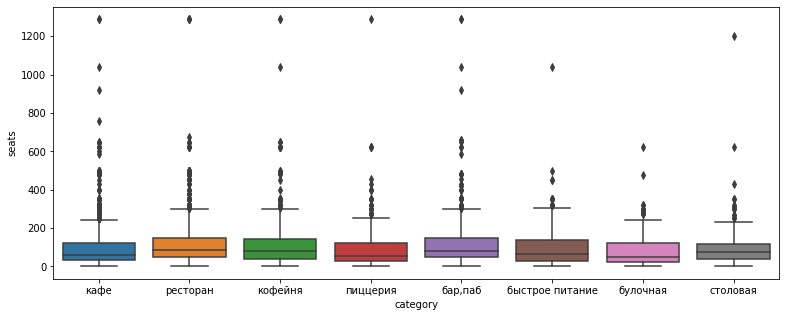

In [16]:
#рассмотрим распределение значений в столбце seats

plt.figure(figsize=(13, 5))

seats_graph = sns.boxplot(x='category', y='seats', data=data)

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Очевидно, что в столбце с посадочными местами очень много выбросов. Скорее всего в выборку попали банкетные залы на большое количество гостей, ресторанные дворики и прсто очень большие заведения. В таком случае для оценки среднего значения стоит воспользоваться медианными значениями.

In [17]:
#Исследуем количество посадочных мест в заведениях по категориям
category_seats = (
    data.groupby('category', as_index=False)
    .agg({'seats': 'median'}))

In [18]:
category_seats = category_seats.sort_values(by = 'seats', ascending = False)

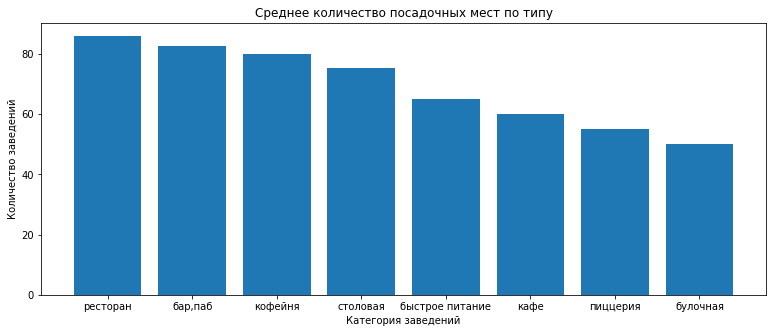

In [19]:
fig, ax = plt.subplots()

ax.bar(category_seats['category'],category_seats['seats'], label='Число заведений по типу')

ax.set_ylabel('Количество заведений')
ax.set_xlabel('Категория заведений')
ax.set_title('Среднее количество посадочных мест по типу')
fig.set_figheight(5) # высота 
fig.set_figwidth(13) # ширина
plt.show()

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Наибольшее среднее количество мест в категории рестораны: более 80, чуть меньше в барах, в кофейнях в среднем не более 80 мест, далее по убывающей следуют категории столовая, фастфуд, кафе, пиццерия и булочная.

In [20]:
#Сколько заведений работает круглосуточно?
data_test = data.groupby('24/7', as_index=False)['name'].agg('count')
data_test

,24/7,name
0,False,7676
1,True,730


In [21]:
#рассмотрим соотношение сетевых и несетевых заведений в датасете
network_rest = (
    data.groupby('chain', as_index=False)
    .agg({'address': 'count'}))
network_rest.rename(columns = {'address':'count'}, inplace = True )
network_rest.loc[network_rest['chain'] == 0, 'chain'] = 'не сетевое'
network_rest.loc[network_rest['chain'] == 1, 'chain'] = 'сетевое'
network_rest


,chain,count
0,не сетевое,5201
1,сетевое,3205


In [22]:
plt.figure(figsize=(5, 5))
fig = go.Figure(data=[go.Pie(labels=network_rest['chain'], values=network_rest['count'])])
fig.update_traces(textposition='inside', textinfo='percent')
fig.update_layout(title_text='Доля сетевых и несетевых заведений')
fig.show() 

<Figure size 360x360 with 0 Axes>

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Количество несетевых заведений преобладает: 61,9%. Рассмотрим распределение по категориям

In [23]:
#рассчитаем суммарное количество заведений по категориям
category = data.groupby('category', as_index=False).agg({'address': 'count'}).sort_values(by='address', ascending = False)
category.rename(columns = {'address':'count'}, inplace = True )
category

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [24]:
#рассчитаем долю категории в сетевых заведениях
chain = data.query('chain == 1')
chain_share = (
    chain.groupby('category', as_index=False)
    .agg({'address': 'count'})).sort_values(by='address', ascending = False)
chain_share.rename(columns = {'address':'count'}, inplace = True )
chain_share


,category,count
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


In [25]:
chain_ratio = chain_share.merge(category, how='left', on = 'category')
chain_ratio['ratio'] = round(chain_ratio['count_x']/chain_ratio['count_y']*100)

chain_ratio = chain_ratio.sort_values(by='ratio', ascending = False)
chain_ratio

,category,count_x,count_y,ratio
6,булочная,157,256,61.0
3,пиццерия,330,633,52.0
2,кофейня,720,1413,51.0
4,быстрое питание,232,603,38.0
1,ресторан,730,2043,36.0
0,кафе,779,2378,33.0
7,столовая,88,315,28.0
5,"бар,паб",169,765,22.0


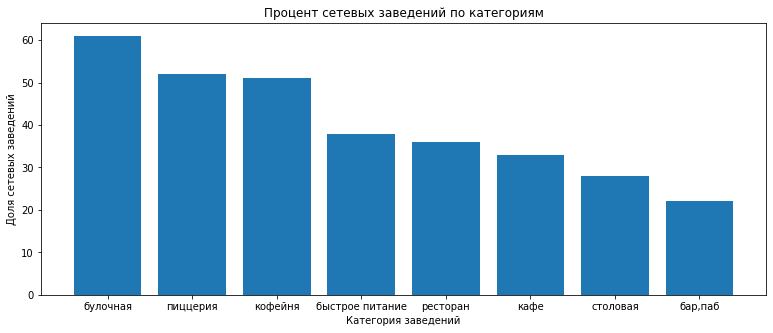

In [26]:
fig, ax = plt.subplots()

ax.bar(chain_ratio['category'],chain_ratio['ratio'], label='Число сетевых заведений по категориям')

ax.set_ylabel('Доля сетевых заведений')
ax.set_xlabel('Категория заведений')
ax.set_title('Процент сетевых заведений по категориям')
fig.set_figheight(5) # высота 
fig.set_figwidth(13) # ширина
plt.show()



<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Среди всех категорий заведений наибольшую долю сетевых имеют булочные (61%), далее практически в равной степени пиццерия и кофейни (52% и 51%), чуть меньше быстрое питание (38%) и ресторан (36%), далее по убывающей следуют кафе (33%), столовая (28%) и бары (22%).

In [27]:
#найдем топ-15 популярных сетей в Москве
top_15_chain= data[data['chain']==True].pivot_table(index='name', values='category', aggfunc='count')\
.sort_values(by='category', ascending=False).head(15)
top_15_chain

,category
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


In [28]:
top_15_chain_names = top_15_chain.index.tolist()

In [29]:
#отфильтруем данные по топ-15 сетей
df_top_chain_15 = data[data['name'].isin(top_15_chain_names)]
df_top_chain_15

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,Теремок,ресторан,"Москва, Ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,1,0.0,Ореховый бульвар,False
7974,Хинкальная,ресторан,"Москва, улица Генерала Белова, 23А",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,1,60.0,улица Генерала Белова,False
7979,Яндекс Лавка,ресторан,"Москва, Шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,1,75.0,Шипиловский проезд,False
7980,Яндекс Лавка,ресторан,"Москва, улица Маршала Захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,1,200.0,улица Маршала Захарова,False


In [30]:
#рассчитаем суммарное количество заведений по категориям
category_top = df_top_chain_15.groupby('category', as_index=False).agg({'address': 'count'}).sort_values(by='address', ascending = False)
category_top.rename(columns = {'address':'count'}, inplace = True )
category_top

,category,count
4,кофейня,336
6,ресторан,186
5,пиццерия,151
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


In [31]:
# строим столбчатую диаграмму 
fig = px.bar(category_top.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Число заведений топ-15 по категориям',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

In [32]:
district_top = df_top_chain_15.groupby('district', as_index=False).agg({'address': 'count'}).sort_values(by='address', ascending = False)
district_top.rename(columns = {'address':'count'}, inplace = True )
district_top

,district,count
5,Центральный административный округ,214
8,Южный административный округ,89
1,Западный административный округ,88
2,Северный административный округ,88
3,Северо-Восточный административный округ,85
0,Восточный административный округ,80
7,Юго-Западный административный округ,70
6,Юго-Восточный административный округ,56
4,Северо-Западный административный округ,46


In [33]:
# строим столбчатую диаграмму 
fig = px.bar(district_top.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Число заведений топ-15 по районам',
                   xaxis_title='Район заведений',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Среди заведений из ТОП-15 сетей в Москве наибольшее число принадлежит категории Кофейни, с большим отрывом следуют категории рестораны и пиццерии. По территориальному признаку закономерно, что ТОП-15 максимально представлены в центральном административном откруге.

In [34]:
#расссмотрим административное деление более подробно.
#Отобразим общее количество заведений и количество заведений каждой категории по районам
district = data.groupby('district', as_index=False).agg({'address': 'count'}).sort_values(by='address', ascending = False)
district.rename(columns = {'address':'count'}, inplace = True )
district

,district,count
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [35]:
plt.figure(figsize=(5, 5))
fig = go.Figure(data=[go.Pie(labels=district['district'], values=district['count'])])
fig.update_traces(textposition='inside', textinfo='percent')
fig.update_layout(title_text='Число заведений по округам г Москвы')
fig.show() 

<Figure size 360x360 with 0 Axes>

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Наибольшая доля заведений находится в Wентральном административном откруге Москвы (26,7). Далее с большим отрывом и практически в равной степени следуют Северный (10.7%), Южный (10.6%), Северо-восточный (10.6%) административные округа. Меньшее количество представлены в Западном, Восточном, Юго-восточном, Юго-западном округах. Наименьшая доля заведений в Северо-Западном административном округе (4,9%). 

In [36]:
#рассмотрим распределение категорий по округам
distinct_category = pd.pivot_table(data,
               index=['district', 'category'],
               values=['address'],
               aggfunc=['count'])
distinct_category = distinct_category.reset_index()
distinct_category.columns=['district', 'category', 'count']

distinct_category

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [37]:
# строим столбчатую диаграмму 
fig = px.bar(distinct_category.sort_values(by='count', ascending=True), # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             color='category', #указываем по какому признаку раскрашивать столбцы
             title='Категории заведений по округам')
# оформляем график
fig.update_layout(title='Категории заведений по округам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Округ')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show() # выводим график

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 В центре Москвы наиболее популярны рестораны, чуть меньшую долю занимают кофейни, кафе и бары. В остальных же округах лидирующая категория - это кафе, в чуть меньшей степени кофейни и рестораны.

In [38]:
#рассмотрим распределение средних рейтингов по категориям
rating_category = pd.pivot_table(data,
               index=['category'],
               values=['rating'],
               aggfunc=['mean'])
rating_category = rating_category.reset_index()
rating_category.columns=['category', 'rating_mean']

rating_category.sort_values(by='rating_mean', ascending=False)

,category,rating_mean
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


In [39]:
fig = px.bar(rating_category, x='category', y='rating_mean',title='Средний рейтинг по категориям')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Средний рейтинг в разрезе категорий колеблется в диапазоне 4.05-4.39. Наибольшее значение у заведений категории бары, пабы. Далее пор убывающей следуют категории пиццерия, ресторан, кофейня, булочная, столовая, кафе, быстрое питание

In [40]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [41]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Средний рейтинг в разрезе округов колеблется в диапазоне 4.10-4.38. Наибольшее значение у заведений в центре Москвы: 4,38. Вероятно, одна из причин уровня качества заведений - высокая конкуренции в данном округе. Далее следуют Северный 4,24, Северо-Западный 4,2 округа, затем примерно на одном уровне  Южный, Западный, Восточный, Юго-Западный округа. Наименьший средний рейтинг у заведений Северо-Восточного и и Юго-Восточного округов.

In [43]:
#Отобразим все заведения датасета на карте 

mw = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mw)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
mw

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Центральный округ отличается по многим параметрам исследования: количеству заведений, среднему рейтингу, структуре, среднему чеку. В этом округе сосредоточено много туристических объектов, мест отдыха и развлечений, в округе развита инфраструткура и транспорт. Также здесь немало объектов недвижимсоти бизнес-класса и выше. Все это способствует высокому трафику, но и высоким арендным ставкам. Средний чек выше как за счет цены, так и за счет покупательской способности в округе. Количество заведений объясняется трафиком и статусностью локаций. Отдельно стоит выделить влияние фудмаркетов и гастрокортов, где на одной площадке сосредоточено несколько десятков заведений, и чаще всего они расположены в центральной части города.

In [44]:
#найдем топ-15 улиц Москвы по количеству заведений
top_15_street = data.pivot_table(index='street', values='address', aggfunc='count').sort_values(by='address', ascending=False).head(15)
top_15_street = top_15_street.reset_index()
top_15_street.columns=['street', 'count']
top_15_street

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [45]:
# строим столбчатую диаграмму 
fig = px.bar(top_15_street.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='street', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Число заведений по топ-15 улицам',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Можно выделить несколько категорий улиц с наибольшим количеством заведений:
  <br> - Наиболее длинные улицы столицы: МКАД, Варшавка, Каширское и Дмитровское шоссе, Ленинградка. Количество точек общепита здесь объясняется протяженностью улиц.
  <br> - Улицы со специфической инфраструктурой: 
      <br> Люблинская в районе Садовода, Аквапарка и большого количества ТЦ 
      <br> Миклухо-Маклая, короткая улица, соединяющая собой двух лидеров списка: Профсоюзную улицу и Ленинский проспект. Это район крупных университетов и студенческих кампусов.
      <br> Пятницкая - короткая улица в историческом центре Замоскворечья с очень большой плотностью всевозможных баров, кафе и ресторанов. Улица находится в пешей доступности от центра Москвы, а также мест концентрации отелей и ночных клубов.
      <br> Вавилова - улица между лидерами списка: Ленинским и Профсоюзной в районе МГУ и Воробьевых гор.
  <br> - Улицы со специфической инфраструктурой и большой протяженностью: 
    Проспект Мира (ВДНХ), Ленинский проспект, Профсоюзная улица и проспект Вернадского: на этих улицах расположены крупнейшие университеты и кампусы (МГУ, РУДН), культурные и развлекательные объекты (цирк, Воробьевы горы и т д).

In [46]:
top_15_street_names = top_15_street.street.tolist()
top_15_street_names

['проспект Мира',
 'Профсоюзная улица',
 'проспект Вернадского',
 'Ленинский проспект',
 'Ленинградский проспект',
 'Дмитровское шоссе',
 'Каширское шоссе',
 'Варшавское шоссе',
 'Ленинградское шоссе',
 'МКАД',
 'Люблинская улица',
 'улица Вавилова',
 'Кутузовский проспект',
 'улица Миклухо-Маклая',
 'Пятницкая улица']

In [47]:
#отфильтруем данные по топ-15 сетей
df_top_15_street = data[data['street'].isin(top_15_street_names)]
df_top_15_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False


In [48]:
#рассчитаем суммарное количество заведений по категориям и улицам:
street_category = pd.pivot_table(df_top_15_street,
               index=['street', 'category'],
               values=['name'],
               aggfunc=['count'])
street_category = street_category.reset_index()
street_category.columns=['street', 'category', 'count']

street_category

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [49]:
fig = px.bar(street_category, x='street', y='count', color='category', title='Категории по улицам')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Можно выделить несколько ТОП-15 улиц с отличной от типичной структурой по категориям заведений:
  <br> - МКАД, где закономерно преобладают кафе, к которым в том числе относятся придорожные заведения и кафе при заправках.
  <br> - Люблинская улица в районе Садовода также большей частью предсталена категорией кафе. 
  <br> - Кафе также преобладают в районе кампуса РУДН: ул Миклухо-Маклая
  <br> - Любители баров и пабов с большой вероятностью отправятся на Пятницкую улицу или Лениградский проспект.
  <br> Остальные же улицы из списка ТОП-15 с типичной структурой, где преобладают кафе и рестораны, чуть меньшую долю занимают кофейни, далее по убывающей фастфуд, бары, пиццерии, булочные и столовые.   

In [50]:
single_street = data.groupby('street', as_index=False)['name'].agg('count')
single_street.query('name==1')

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [51]:
single_street_names = single_street.street.tolist()


df_single_street_names = data[data['street'].isin(single_street_names)]
df_single_street_names

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


In [52]:
single_cat = df_single_street_names.groupby('category', as_index=False)['name'].agg('count')
single_cat.sort_values(by='name',ascending = False)

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [53]:
single_dist = df_single_street_names.groupby('district', as_index=False)['name'].agg('count')
single_dist.sort_values(by='name',ascending = False)

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Структура заведений, которые являются единственными на улице, по категориям или округам яляется типичной. Рассмотрим особенности в структуре по названиям
  

In [54]:
single_cat = df_single_street_names.groupby('name', as_index=False)['address'].agg('count')
single_cat.sort_values(by='address',ascending = False).head(15)

,name,address
2890,Кафе,189
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
5083,Хинкальная,44
5421,Шаурма,43


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 ТОП-15 по количеству таких заведений составляют практически те же сети, что и в целом по всему датасету. Лидеры Московского рынка общепита явно используют одну и ту же стратегию: находить свободные улицы и открыавать там новые точки
    

In [55]:
#рассмотрим данные по среднему чеку в разрезе округов
bill_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
# создаём карту Москвы
ms = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по округам',
).add_to(ms)

# выводим карту
ms

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Средний чек наиболее высокий в западном и центральном округах: 1000 р, средний в Северо-западном округе (700 р), наиболее низкий в Юго-Восточном административном округе.  

In [57]:
#рассмотрим какие зведения имеют низки йрейтинг
low_rating = data.query('rating<4')
low_rating

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
36,Пекарня № 1 Грузинская кухня,кафе,"Москва, Коровинское шоссе, 33А",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,NaN,NaN,NaN,NaN,0,21.0,Коровинское шоссе,False
37,Халяль закусочная,кафе,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, 08:00–23:00",55.888023,37.515443,3.9,NaN,NaN,NaN,NaN,0,NaN,Коровинское шоссе,False
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN,Ижорская улица,False
42,Варня кафе,быстрое питание,"Москва, Коровинское шоссе, 29, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.880010,37.520204,3.8,NaN,NaN,NaN,NaN,0,46.0,Коровинское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8391,Кафе Кенч,кафе,"Москва, 1-я Новокузьминская улица, 3",Юго-Восточный административный округ,"ежедневно, 11:00–00:00",55.716771,37.785316,2.8,NaN,NaN,NaN,NaN,0,45.0,1-я Новокузьминская улица,False
8392,Касабланка,кафе,"Москва, Большая Косинская улица, 27",Восточный административный округ,пн-чт 08:00–17:00; пт 08:00–16:00,55.718514,37.857576,3.3,NaN,NaN,NaN,NaN,0,NaN,Большая Косинская улица,False
8395,Истира Запрафка,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,NaN,55.724686,37.710558,2.9,NaN,NaN,NaN,NaN,0,NaN,Юго-Восточный административный округ,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


In [58]:
low_rating_name = low_rating.groupby('name', as_index=False)['address'].agg('count')
low_rating_name.sort_values(by='address',ascending = False).head(15)

,name,address
426,Кафе,82
863,Яндекс Лавка,22
827,Шаурма,20
147,One Price Coffee,15
788,Чайхана,12
55,Cofix,11
496,Крошка Картошка,11
42,CofeFest,10
39,Cinnabon,7
66,Drive Café,7


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 рекордсменами по заведениям с низким рейтингом являются сети Кафе, Яндекс Лавка, Шаурма и One Price Coffee. Рассмотрим антирейтинг категорий

In [59]:
low_rating_dist = low_rating.groupby('category', as_index=False)['name'].agg('count')
low_rating_dist.sort_values(by='name',ascending = False)

,category,name
3,кафе,543
6,ресторан,177
2,быстрое питание,162
4,кофейня,138
7,столовая,44
0,"бар,паб",40
5,пиццерия,35
1,булочная,30


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Наибольшее число заведений с рейтингом ниже 4 это кафе, также значительную долю имеют рестораны, фастфуд и кофейни. К столовым, барам, пиццериям и булочным меньше всего претензий, или клиенты там менее требовательны.

## Вывод

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 По итогам исследования данных о рынке общественного питания в Москве сделаны следующие выводы:
  <br> - Наибольшее количество зведений в категории кафе (28%), чуть меньше ресторанов (23,2%). Со значительным отставанием далее следуют кофейни (16,6%), бары (9,7%), пиццерии (8,24%), фастфуд (6,69%), столовая (4,15%) и булочная (3,41%)
  <br> - Наибольшее среднее количество посадочных мест в категории рестораны: более 80, чуть меньше в барах, в кофейнях в среднем не более 80 мест, далее по убывающей следуют категории столовая, фастфуд, кафе, пиццерия и булочная.
  <br> - Количество несетевых заведений в данных преобладает: 61,9%.
  <br> - Среди всех категорий заведений наибольшую долю сетевых имеют булочные (61%), далее практически в равной степени пиццерия и кофейни (52% и 51%), чуть меньше быстрое питание (38%) и ресторан (36%), далее по убывающей следуют кафе (33%), столовая (28%) и бары (22%).
  <br> - Среди заведений из ТОП-15 сетей в Москве наибольшее число принадлежит категории Кофейни, с большим отрывом следуют категории рестораны и пиццерии. 
  <br> - По территориальному признаку сети ТОП-15 максимально представлены в центральном административном округе.
  <br> - В целом наибольшая доля заведений находится в Центральном административном откруге Москвы (26,7). Далее с большим отрывом и практически в равной степени следуют Северный (10.7%), Южный (10.6%), Северо-восточный (10.6%) административные округа. Меньшее количество представлены в Западном, Восточном, Юго-восточном, Юго-западном округах. Наименьшая доля заведений в Северо-Западном административном округе (4,9%).     
  <br> - В центре Москвы наиболее популярны рестораны, чуть меньшую долю занимают кофейни, кафе и бары. В остальных же округах лидирующая категория - это кафе, в чуть меньшей степени кофейни и рестораны.
  <br> - Средний рейтинг в разрезе категорий колеблется в диапазоне 4.05-4.39. Наибольшее значение у заведений категории бары, пабы. Далее по убывающей следуют категории пиццерия, ресторан, кофейня, булочная, столовая, кафе, быстрое питание
  <br> - Средний рейтинг в разрезе округов колеблется в диапазоне 4.10-4.38. Наибольшее значение у заведений в центре Москвы: 4,38. Вероятно, одна из причин высокого качества заведений - уровень конкуренции в данном округе. Далее следуют Северный 4,24, Северо-Западный 4,2 округа, затем примерно на одном уровне Южный, Западный, Восточный, Юго-Западный округа. Наименьший средний рейтинг у заведений Северо-Восточного и и Юго-Восточного округов.
   <br> - Средний чек наиболее высокий в западном и центральном округах: 1000 р, средний в Северо-западном округе (700 р), наиболее низкий в Юго-Восточном административном округе.    

In [60]:
#рассмотрим данные по среднему чеку в разрезе округов
bill_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Представляет интерес территориальная специфика рынка:
  <br> Можно выделить несколько категорий улиц с наибольшим количеством заведений:
  <br>
    <br> - Наиболее длинные улицы столицы: МКАД, Варшавка, Каширское и Дмитровское шоссе, Ленинградка. Количество точек общепита здесь вероятно объясняется протяженностью улиц.
  <br>
    <br> - Улицы со специфической инфраструктурой: 
      <br> Люблинская в районе Садовода, Аквапарка и большого количества ТЦ 
      <br> Миклухо-Маклая, короткая улица, соединяющая собой двух лидеров списка: Профсоюзную улицу и Ленинский проспект. Это район крупных университетов и студенческих кампусов.
      <br> Пятницкая - короткая улица в историческом центре Замоскворечья с очень большой плотностью всевозможных баров, кафе и ресторанов. Улица находится в пешей доступности от центра Москвы, а также мест концентрации отелей и ночных клубов.
      <br> Вавилова - улица между лидерами списка: Ленинским и Профсоюзной в районе МГУ и Воробьевых гор.
  <br>
    <br> - Улицы со специфической инфраструктурой и большой протяженностью: 
    Проспект Мира (ВДНХ), Ленинский проспект, Профсоюзная улица и проспект Вернадского: на этих улицах расположены крупнейшие университеты и кампусы (МГУ, РУДН), культурные и развлекательные объекты (цирк, Воробьевы горы и т д).
  <br>  
  <br> Изучена структура заведений ТОП-15 в разрезе категорий и расположения:
  <br> - МКАД, где закономерно преобладают кафе, к которым в том числе относятся придорожные заведения и кафе при заправках.
  <br> - Люблинская улица в районе Садовода также большей частью предсталена категорией кафе.
  <br> - Кафе также преобладают в районе кампуса РУДН: ул Миклухо-Маклая
  <br> - Любители баров и пабов с большой вероятностью отправятся на Пятницкую улицу или Лениградский проспект.
  <br> - Остальные же улицы из списка ТОП-15 с типичной структурой, где преобладают кафе и рестораны, чуть меньшую долю занимают кофейни, далее по убывающей фастфуд, бары, пиццерии, булочные и столовые.
  <br>    
  <br>    Отмечена закономерность, что лидеры Московского рынка общепита явно используют одну и ту же стратегию: находят свободные улицы и открыавать там новые точки. ТОП-15 по количеству заведений, единственных на улице, составляют практически те же сети, что и в целом по всему датасету.
    

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Стоит отметить особенности заведений с самыми низками рейтингами:
  <br> - рекордсменами по заведениям с низким рейтингом являются сети Кафе, Яндекс Лавка, Шаурма и One Price Coffee. 
  <br> - Наибольшее число заведений с рейтингом ниже 4 это кафе, также значительную долю имеют рестораны, фастфуд и кофейни. К столовым, барам, пиццериям и булочным меньше всего претензий, или клиенты там менее требовательны.

## Детализация исследования: открытие кофейни

In [61]:
#отфильтруем данные по кофейням
data_coffee = data.query('category == "кофейня"')
data_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


In [62]:
#сколько всего кофеен
coffee_count = data_coffee.groupby('category', as_index=False)['name'].agg('count')
coffee_count

,category,name
0,кофейня,1413


In [63]:
coffee_district = data_coffee.groupby('district', as_index=False)['name'].agg('count')
coffee_district.sort_values(by='name',ascending = False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [64]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_district.sort_values(by='name', ascending=False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='name' 
            )
# оформляем график
fig.update_layout(title='Число кофеен по округам г Москвы',
                   xaxis_title='Округ',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

In [65]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам',
).add_to(msc)

# выводим карту
msc

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Наибольшее число коффеен в центральном округе, далее с большим отрывом Северный, Северо-восточный, Западный, Южный округа. Наименьшее количество кофеен в Северо-западном округе.

In [66]:
#рассмотрим средние рейтинги по округам
coffee_rating = data_coffee.groupby('district', as_index=False)['rating'].agg('mean')
coffee_rating.sort_values(by='rating',ascending = False)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [67]:

mscw = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по округам',
).add_to(mscw)

# выводим карту
mscw


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Лучшие, по мнению клиентов, кофейни находятся в центральном и Северо-западном округах. Неплохие рейтинги также у зведений в  Северном, Юго-Западном и Восточном округах. Наименьшими рейтингами обладают кофейни Северо-Восточного и Западного округов.
  <br>  Детально рейтинги можно изучить на карте ниже


In [68]:

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mscw)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
mscw

In [69]:
#Изучим среднюю стоимость чашки кофе в разрезе округов:
coffee_cup = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
coffee_cup.sort_values(by='middle_coffee_cup',ascending = False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [70]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_cup.sort_values(by='middle_coffee_cup', ascending=False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='middle_coffee_cup', # указываем столбец с данными для оси Y
             text='middle_coffee_cup' 
            )
# оформляем график
fig.update_layout(title='Средняя стоимость чашки кофе по округам г Москвы',
                   xaxis_title='Округ',
                   yaxis_title='Средняя цена чашки кофе')
fig.show() # выводим график

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Самый дорогой кофе в Юго-западном, Центральном и Западном округах. Кофейни с более низкими ценами расположены в Юго-Восточном и Восточном округах.

In [71]:
#какой режим работы обычно у кофеен? Есть ли среди них круглосуточные?
coffee_cup = data_coffee.groupby('24/7', as_index=False)['name'].agg('count')
coffee_cup

,24/7,name
0,False,1354
1,True,59


<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 Работникам ночных смен особенно актуален кофе, и 59 круглосуточных кофеен к их услугам

<div style="background-color:black; color:#ffffff; text-align:left; padding:2%">
💬 При открытии кофейни можно отталкиваться от одной из двух стратегий:
      <br> Выбирать район с высокой конкуренцией и большим трафиком
      <br> Выбирать еще неосвоенные районы и места с низкой конкуренцией
   <br>При первой стратегии стоит обратить внимание на локации в центральном округе, а также в Северном и Северо-восточном округах
В Центральном и Северном районах клиенты более требовательны: средние рейтинги довольно высокие. В Северо-Восточном же округе при большом количестве заведений рейтинги у них довольно низкие, и можно получить клиентов через высокий сервис. У заведений в центре более высокий средний чек, что может улучшить экономику предприятия. 
   <br> При выборе второй стратегии стоит обратить внимание на районы с наименьшей плотностью кофеен: это Северо-Западный округ. Но при этом рейтинги кофеен здесь очень высокие, вероятно здесь более высокие стандарты качества заведений. Цена чашки кофе в районе чуть выше средней.
  <br> Можно воспользоваться уже проверенной стратегией ТОП сетей Москвы и выбрать в подходящем округе несколько привлекательных улиц, где еще нет ни одного заведения.    

Презентация: <https://drive.google.com/file/d/1FXcIBQYTX8Mq44NBTCapwNAJatljq9c0/view?usp=drive_link>